![](https://raw.githubusercontent.com/FrankFeng-23/SPREAD/master/images/sample_images_compressed-min.png)

## Train custom instance segmentation model using Detectron2 on the SPREAD dataset

##### https://github.com/FrankFeng-23/SPREAD
##### https://papers.ssrn.com/sol3/papers.cfm?abstract_id=4977986
##### https://zenodo.org/records/14515915

In [1]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)
if torch.cuda.is_available:
    devices       = [d for d in range(torch.cuda.device_count())]
    device_names  = [torch.cuda.get_device_name(d) for d in devices]
    print(f'{device_names}')
else:
    print('WARNING: CUDA not available!')

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Fri_Jan__6_16:45:21_PST_2023
Cuda compilation tools, release 12.0, V12.0.140
Build cuda_12.0.r12.0/compiler.32267302_0
torch:  2.5 ; cuda:  cu124
detectron2: 0.6
['NVIDIA RTX A6000', 'NVIDIA RTX A6000']


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

#### Replacement for Colab `cv2_imshow()` found here: https://gist.github.com/lalanikarim/df44bac00918ce8efdfc438c2d73592d

In [3]:
import numpy as np 
import cv2
# comment the original import from google.colab.patch
# from google.colab.patches import cv2_imshow 

# import pytplot from matplotlib if not already imported
import matplotlib.pyplot as plt

# for inline plot rendering
%matplotlib inline

def cv2_imshow(img):
    # set appropriate figure size in case it is too small or too large. Don't worry about it being square.
    plt.figure(figsize=(10,10))
    try:
        # try simple BGR 2 RGB conversion so pyplot can show the image
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    except:
        # this is for a special case in case the above doesn't work after applying convolutions
        plt.imshow(cv2.cvtColor(np.uint8(np.absolute(img)), cv2.COLOR_BGR2RGB))
    plt.show()

The default models are trained on the COCO dataset (generic natural images) so let us go ahead and load a generic image to see if detectron is working. **We will run a pre-trained model on this image.**

--2025-01-13 21:19:15--  https://hips.hearstapps.com/hmg-prod/images/white-kitchen-tile-floor-663e73179c3c4.jpg
Resolving hips.hearstapps.com (hips.hearstapps.com)... 151.101.240.155
Connecting to hips.hearstapps.com (hips.hearstapps.com)|151.101.240.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564946 (2.4M) [image/jpeg]
Saving to: ‘/tmp/kitchen.jpg’

/tmp/kitchen.jpg    100%[===================>]   2.45M  9.66MB/s    in 0.3s    

2025-01-13 21:19:15 (9.66 MB/s) - ‘/tmp/kitchen.jpg’ saved [2564946/2564946]



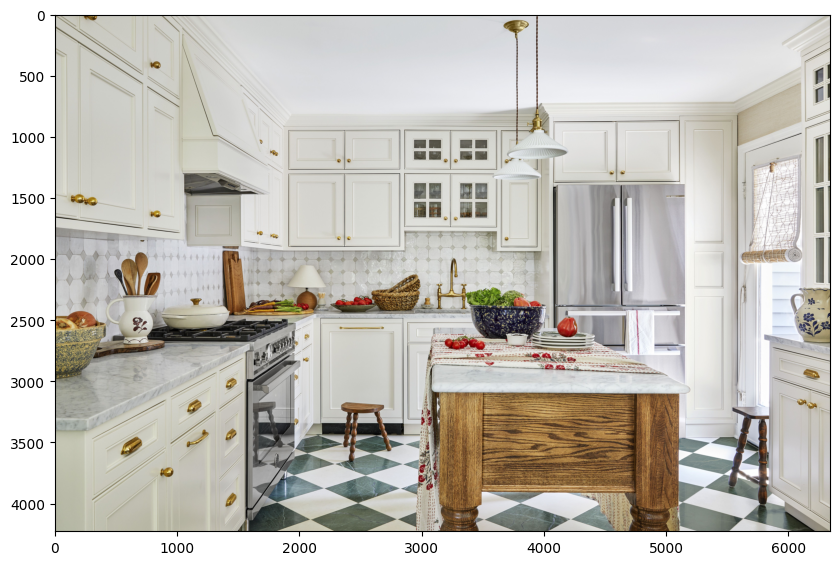

In [4]:
fn = "/tmp/kitchen.jpg"
!wget --user-agent='Mozilla 5.0' 'https://hips.hearstapps.com/hmg-prod/images/white-kitchen-tile-floor-663e73179c3c4.jpg' --output-document={fn}
kitchen = cv2.imread(fn)
cv2_imshow(kitchen)

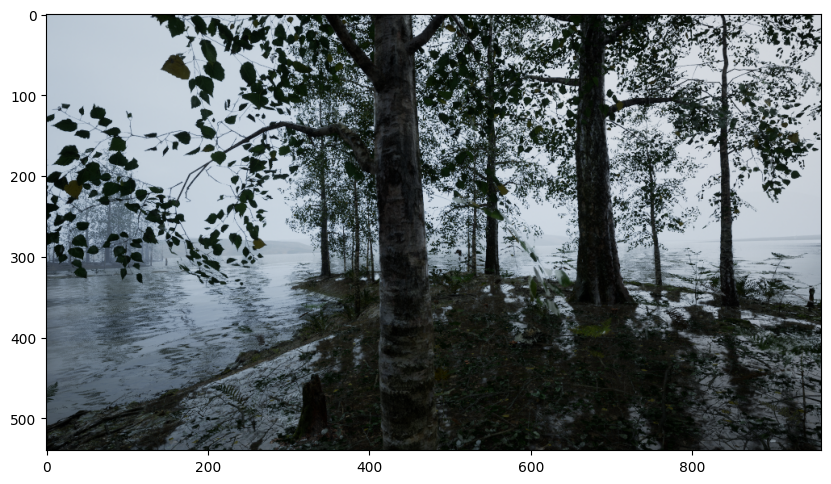

In [5]:
fn   = '/mnt/raid1/dataset/spread/spread-v2/birch-forest/rgb/Tree10011_1720527021.png'
tree = cv2.imread(fn)
cv2_imshow(tree)

#### Create a detectron2 config and a detectron2 DefaultPredictor to run inference on the images

In [6]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo.  https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(kitchen)

[01/13 21:19:17 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


/mnt/raid1/venvs/sam2/lib/python3.12/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [7]:
# look at the outputs - tensors and bounding boxes.
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([44, 69, 56, 44, 44, 45, 60, 56, 45, 75, 45, 72, 41, 44, 47, 45, 58, 45,
        47, 72, 47, 46, 45], device='cuda:0')
Boxes(tensor([[6.5815e+02, 1.9479e+03, 7.6059e+02, 2.2956e+03],
        [7.9914e+02, 2.4244e+03, 1.9963e+03, 3.9455e+03],
        [2.3403e+03, 3.1646e+03, 2.7578e+03, 3.6395e+03],
        [4.8495e+02, 2.0909e+03, 5.8961e+02, 2.3047e+03],
        [5.4653e+02, 2.0054e+03, 6.7607e+02, 2.3027e+03],
        [5.5457e-01, 2.4994e+03, 4.1767e+02, 2.9753e+03],
        [2.9884e+03, 2.6632e+03, 5.1691e+03, 4.1879e+03],
        [5.5037e+03, 3.1771e+03, 5.8511e+03, 4.0149e+03],
        [2.2754e+03, 2.3646e+03, 2.6382e+03, 2.4396e+03],
        [6.0042e+03, 2.2164e+03, 6.3410e+03, 2.6818e+03],
        [3.3910e+03, 2.3489e+03, 4.0171e+03, 2.6853e+03],
        [4.1557e+03, 1.3937e+03, 5.1730e+03, 3.6036e+03],
        [4.2928e+02, 2.3030e+03, 8.3838e+02, 2.6952e+03],
        [7.2964e+02, 2.1157e+03, 8.5757e+02, 2.2967e+03],
        [1.9744e+03, 2.2680e+03, 2.1491e+03, 2.4199e+03]

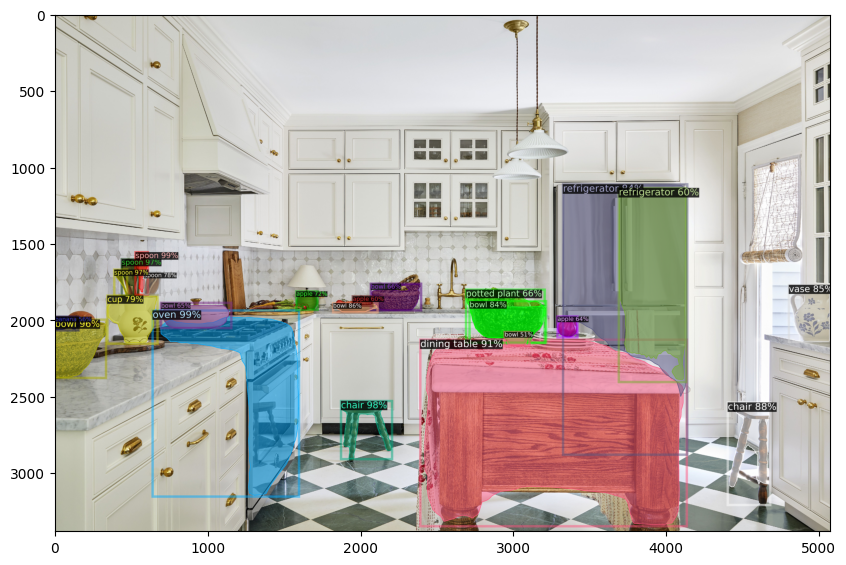

In [8]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(kitchen[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.8)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

#### Now that we know the model is working on a generic image, let's test the same model on one image from the SPREAD dataset...

Unfortunately the model __mask_rcnn_R_50_FPN_3x__ [has not been trained on trees](https://gist.github.com/AruniRC/7b3dadd004da04c80198557db5da4bda), so we can't expect great results.

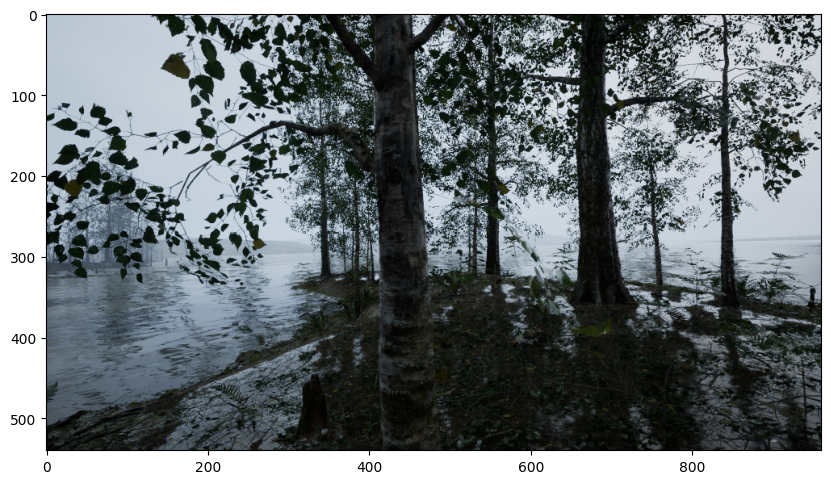

In [9]:
sci_outputs = predictor(tree)
sci_v = Visualizer(tree[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
sci_out = sci_v.draw_instance_predictions(sci_outputs["instances"].to("cpu"))
cv2_imshow(sci_out.get_image()[:, :, ::-1])

No detection at all. Now let's try to fine-tune one of the pretrained models with the SPREAD dataset...

# Train on a custom dataset

Import the necessary function to register datasets in the COCO format. We'll register both the training, validation and test sets. Please note that we are working with training and validation data that is already in the COCO format and that has been merged in a single JSON file (per each set) that describes all the annotations, including segmentation, from all the training images.

In [10]:
from detectron2.data.datasets import register_coco_instances
spread_dir = '/mnt/raid1/dataset/spread/spread-v2'
register_coco_instances("spread_train", {}, f"{spread_dir}/train.json", "/mnt/raid1/dataset/spread/spread-v2-coco")
register_coco_instances("spread_valid", {}, f"{spread_dir}/valid.json", "/mnt/raid1/dataset/spread/spread-v2-coco")
register_coco_instances("spread_test" , {}, f"{spread_dir}/test.json" , "/mnt/raid1/dataset/spread/spread-v2-coco")

Let us extract the metadata and dataset dictionaries for both training and validation datasets. These can be used later for other purposes, like visualization, model training, evaluation, etc. We will see a visualization example right away.

In [11]:
train_metadata      = MetadataCatalog.get("spread_train")
train_dataset_dicts = DatasetCatalog.get ("spread_train")

[01/13 21:19:35 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/train.json takes 14.37 seconds.
[01/13 21:19:35 d2.data.datasets.coco]: Loaded 8356 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/train.json


In [12]:
val_metadata        = MetadataCatalog.get("spread_valid")
val_dataset_dicts   = DatasetCatalog.get ("spread_valid")

[01/13 21:19:41 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/valid.json takes 5.31 seconds.
[01/13 21:19:41 d2.data.datasets.coco]: Loaded 3042 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/valid.json


In [13]:
test_metadata        = MetadataCatalog.get("spread_test")
test_dataset_dicts   = DatasetCatalog.get ("spread_test")

[01/13 21:19:47 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/test.json takes 2.76 seconds.
[01/13 21:19:47 d2.data.datasets.coco]: Loaded 1611 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/test.json


In [14]:
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (18,10)

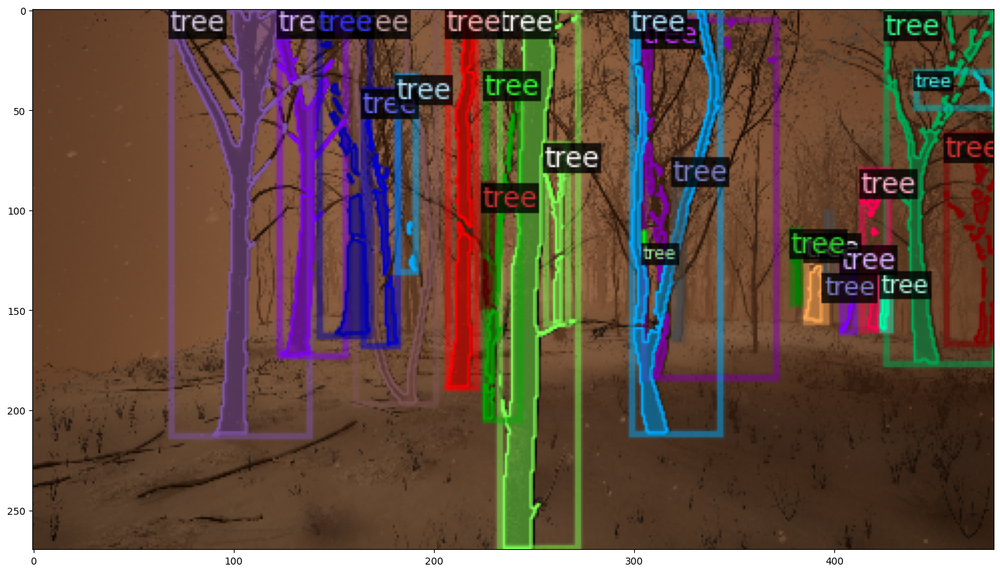

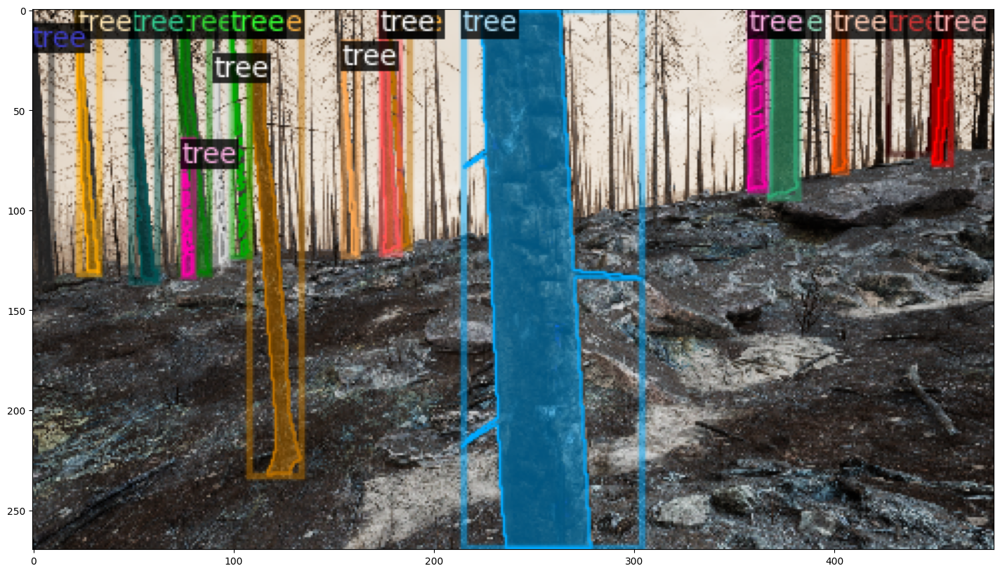

In [15]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show(18,10)

# Train

Now we are ready to train a Mask R-CNN model using the Detectron2 library. We start by setting up a configuration file (.cfg) for the model. The configuration file contains many details including the output directory path, training dataset information, pre-trained weights, base learning rate, maximum number of iterations, etc.

In [16]:
from detectron2.engine import DefaultTrainer

model_name = 'mask_rcnn_X_101_32x8d_FPN_3x'

cfg = get_cfg()
cfg.OUTPUT_DIR      = "/mnt/raid1/repos/maskdino/maskdino-output/" + model_name
cfg.merge_from_file(model_zoo.get_config_file(f"COCO-InstanceSegmentation/{model_name}.yaml"))
cfg.DATASETS.TRAIN  = ("spread_train",)
cfg.DATASETS.TEST   = ("spread_valid")
cfg.DATALOADER.NUM_WORKERS = 32
cfg.MODEL.WEIGHTS   = model_zoo.get_checkpoint_url(f"COCO-InstanceSegmentation/{model_name}.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 32  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR  = 0.0005   # pick a good LR
cfg.SOLVER.MAX_ITER = 10000    # 1000 iterations = 1.5 hours on RTX A6000
cfg.SOLVER.STEPS    = []       # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # We have 1 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.

cfg.SOLVER.CHECKPOINT_PERIOD    = 500
cfg.SOLVER.REFERENCE_WORLD_SIZE = 2 # for dataparallel hopefully (nope, it doesn't work)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available

[01/13 21:19:48 d2.engine.defaults]: Auto-scaling the config to batch_size=16, learning_rate=0.00025, max_iter=20000, warmup=2000.
[01/13 21:19:49 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), str

[01/13 21:20:05 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/train.json takes 15.69 seconds.
[01/13 21:20:05 d2.data.datasets.coco]: Loaded 8356 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/train.json
[01/13 21:20:05 d2.data.build]: Removed 0 images with no usable annotations. 8356 images left.
[01/13 21:20:06 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    tree    | 291274       |
|            |              |
[01/13 21:20:06 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[01/13 21:20:06 d2.data.build]: Using training sampler TrainingSampler
[01/13 21:20:06 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/13 21:20:06 d2.data.common]: Serializing 8356 elements t

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

In [17]:
_please_stop_here_with_an_error_

NameError: name '_please_stop_here_with_an_error_' is not defined

### Launch the training

In [18]:
trainer.train() #Start the training process

[01/13 21:21:13 d2.engine.train_loop]: Starting training from iteration 0
[01/13 21:22:41 d2.utils.events]:  eta: 22:37:54  iter: 19  total_loss: 7.68  loss_cls: 0.7643  loss_box_reg: 0.4314  loss_mask: 0.6844  loss_rpn_cls: 5.091  loss_rpn_loc: 0.7518    time: 4.0769  last_time: 4.0882  data_time: 0.3664  last_data_time: 0.0521   lr: 2.6226e-06  max_mem: 37639M
[01/13 21:24:03 d2.utils.events]:  eta: 22:40:57  iter: 39  total_loss: 6.682  loss_cls: 0.7251  loss_box_reg: 0.4904  loss_mask: 0.6771  loss_rpn_cls: 4.066  loss_rpn_loc: 0.7282    time: 4.0904  last_time: 4.1106  data_time: 0.0305  last_data_time: 0.0517   lr: 5.1201e-06  max_mem: 37639M
[01/13 21:25:26 d2.utils.events]:  eta: 22:44:17  iter: 59  total_loss: 5.167  loss_cls: 0.6636  loss_box_reg: 0.6053  loss_mask: 0.6666  loss_rpn_cls: 2.621  loss_rpn_loc: 0.6549    time: 4.1022  last_time: 4.1109  data_time: 0.0284  last_data_time: 0.0256   lr: 7.6176e-06  max_mem: 37639M
[01/13 21:26:48 d2.utils.events]:  eta: 22:45:47  i

[01/13 21:59:43 d2.utils.events]:  eta: 22:11:42  iter: 559  total_loss: 2.399  loss_cls: 0.4614  loss_box_reg: 0.7825  loss_mask: 0.3888  loss_rpn_cls: 0.2665  loss_rpn_loc: 0.5    time: 4.1122  last_time: 4.1595  data_time: 0.0274  last_data_time: 0.0449   lr: 7.0055e-05  max_mem: 37641M
[01/13 22:01:06 d2.utils.events]:  eta: 22:10:20  iter: 579  total_loss: 2.371  loss_cls: 0.4676  loss_box_reg: 0.7766  loss_mask: 0.3866  loss_rpn_cls: 0.2722  loss_rpn_loc: 0.4898    time: 4.1122  last_time: 4.1397  data_time: 0.0319  last_data_time: 0.0531   lr: 7.2553e-05  max_mem: 37641M
[01/13 22:02:31 d2.utils.events]:  eta: 22:09:05  iter: 599  total_loss: 2.332  loss_cls: 0.4595  loss_box_reg: 0.7793  loss_mask: 0.3551  loss_rpn_cls: 0.2557  loss_rpn_loc: 0.4913    time: 4.1179  last_time: 4.1416  data_time: 0.0287  last_data_time: 0.0625   lr: 7.505e-05  max_mem: 37641M
[01/13 22:03:54 d2.utils.events]:  eta: 22:07:49  iter: 619  total_loss: 2.377  loss_cls: 0.4542  loss_box_reg: 0.7899  lo

[01/13 22:38:22 d2.utils.events]:  eta: 21:35:08  iter: 1119  total_loss: 2.138  loss_cls: 0.414  loss_box_reg: 0.7138  loss_mask: 0.3264  loss_rpn_cls: 0.2357  loss_rpn_loc: 0.4548    time: 4.1223  last_time: 4.1467  data_time: 0.0299  last_data_time: 0.0330   lr: 0.00013999  max_mem: 37641M
[01/13 22:39:44 d2.utils.events]:  eta: 21:33:48  iter: 1139  total_loss: 2.172  loss_cls: 0.4228  loss_box_reg: 0.7271  loss_mask: 0.3287  loss_rpn_cls: 0.2306  loss_rpn_loc: 0.4608    time: 4.1223  last_time: 4.1467  data_time: 0.0316  last_data_time: 0.0233   lr: 0.00014248  max_mem: 37641M
[01/13 22:41:07 d2.utils.events]:  eta: 21:32:31  iter: 1159  total_loss: 2.149  loss_cls: 0.4103  loss_box_reg: 0.7186  loss_mask: 0.3125  loss_rpn_cls: 0.2305  loss_rpn_loc: 0.4555    time: 4.1224  last_time: 4.1307  data_time: 0.0310  last_data_time: 0.0384   lr: 0.00014498  max_mem: 37641M
[01/13 22:42:29 d2.utils.events]:  eta: 21:31:10  iter: 1179  total_loss: 2.157  loss_cls: 0.4175  loss_box_reg: 0.7

[01/13 23:16:52 d2.utils.events]:  eta: 20:57:37  iter: 1679  total_loss: 2.049  loss_cls: 0.3921  loss_box_reg: 0.6871  loss_mask: 0.3137  loss_rpn_cls: 0.2203  loss_rpn_loc: 0.4356    time: 4.1230  last_time: 4.1325  data_time: 0.0288  last_data_time: 0.0377   lr: 0.00020992  max_mem: 37641M
[01/13 23:18:15 d2.utils.events]:  eta: 20:56:08  iter: 1699  total_loss: 2.062  loss_cls: 0.4063  loss_box_reg: 0.6887  loss_mask: 0.3139  loss_rpn_cls: 0.2145  loss_rpn_loc: 0.4481    time: 4.1230  last_time: 4.0973  data_time: 0.0293  last_data_time: 0.0310   lr: 0.00021241  max_mem: 37641M
[01/13 23:19:37 d2.utils.events]:  eta: 20:54:46  iter: 1719  total_loss: 2.057  loss_cls: 0.4037  loss_box_reg: 0.6929  loss_mask: 0.3153  loss_rpn_cls: 0.2349  loss_rpn_loc: 0.4261    time: 4.1229  last_time: 4.1137  data_time: 0.0294  last_data_time: 0.0337   lr: 0.00021491  max_mem: 37641M
[01/13 23:20:59 d2.utils.events]:  eta: 20:53:25  iter: 1739  total_loss: 2.014  loss_cls: 0.3973  loss_box_reg: 0.

[01/13 23:55:22 d2.utils.events]:  eta: 20:18:43  iter: 2239  total_loss: 1.993  loss_cls: 0.3896  loss_box_reg: 0.6751  loss_mask: 0.2921  loss_rpn_cls: 0.2073  loss_rpn_loc: 0.4297    time: 4.1229  last_time: 4.1064  data_time: 0.0302  last_data_time: 0.0302   lr: 0.00025  max_mem: 37641M
[01/13 23:56:45 d2.utils.events]:  eta: 20:17:23  iter: 2259  total_loss: 2.01  loss_cls: 0.3914  loss_box_reg: 0.6778  loss_mask: 0.2961  loss_rpn_cls: 0.2104  loss_rpn_loc: 0.4432    time: 4.1230  last_time: 4.1752  data_time: 0.0304  last_data_time: 0.0458   lr: 0.00025  max_mem: 37641M
[01/13 23:58:08 d2.utils.events]:  eta: 20:16:11  iter: 2279  total_loss: 2.02  loss_cls: 0.3888  loss_box_reg: 0.6791  loss_mask: 0.302  loss_rpn_cls: 0.2041  loss_rpn_loc: 0.4222    time: 4.1230  last_time: 4.1250  data_time: 0.0308  last_data_time: 0.0470   lr: 0.00025  max_mem: 37641M
[01/13 23:59:30 d2.utils.events]:  eta: 20:14:56  iter: 2299  total_loss: 2.031  loss_cls: 0.39  loss_box_reg: 0.672  loss_mask

[01/14 00:33:53 d2.utils.events]:  eta: 19:40:35  iter: 2799  total_loss: 1.988  loss_cls: 0.3853  loss_box_reg: 0.6607  loss_mask: 0.3053  loss_rpn_cls: 0.2058  loss_rpn_loc: 0.4314    time: 4.1233  last_time: 4.0935  data_time: 0.0304  last_data_time: 0.0325   lr: 0.00025  max_mem: 37641M
[01/14 00:35:16 d2.utils.events]:  eta: 19:39:01  iter: 2819  total_loss: 2.006  loss_cls: 0.3939  loss_box_reg: 0.6674  loss_mask: 0.3047  loss_rpn_cls: 0.2168  loss_rpn_loc: 0.4487    time: 4.1232  last_time: 4.1550  data_time: 0.0293  last_data_time: 0.0307   lr: 0.00025  max_mem: 37641M
[01/14 00:36:38 d2.utils.events]:  eta: 19:37:43  iter: 2839  total_loss: 2.024  loss_cls: 0.3881  loss_box_reg: 0.6715  loss_mask: 0.3062  loss_rpn_cls: 0.2085  loss_rpn_loc: 0.4469    time: 4.1232  last_time: 4.1163  data_time: 0.0320  last_data_time: 0.0339   lr: 0.00025  max_mem: 37641M
[01/14 00:38:01 d2.utils.events]:  eta: 19:36:33  iter: 2859  total_loss: 1.981  loss_cls: 0.3847  loss_box_reg: 0.669  loss

[01/14 01:12:22 d2.utils.events]:  eta: 19:01:23  iter: 3359  total_loss: 1.958  loss_cls: 0.3783  loss_box_reg: 0.6588  loss_mask: 0.2952  loss_rpn_cls: 0.2012  loss_rpn_loc: 0.4299    time: 4.1228  last_time: 4.1301  data_time: 0.0303  last_data_time: 0.0357   lr: 0.00025  max_mem: 37641M
[01/14 01:13:44 d2.utils.events]:  eta: 18:59:52  iter: 3379  total_loss: 1.968  loss_cls: 0.3751  loss_box_reg: 0.6602  loss_mask: 0.2972  loss_rpn_cls: 0.2035  loss_rpn_loc: 0.4327    time: 4.1228  last_time: 4.0767  data_time: 0.0289  last_data_time: 0.0307   lr: 0.00025  max_mem: 37641M
[01/14 01:15:07 d2.utils.events]:  eta: 18:58:23  iter: 3399  total_loss: 2.01  loss_cls: 0.3826  loss_box_reg: 0.6705  loss_mask: 0.2993  loss_rpn_cls: 0.2069  loss_rpn_loc: 0.4306    time: 4.1227  last_time: 4.0610  data_time: 0.0310  last_data_time: 0.0097   lr: 0.00025  max_mem: 37641M
[01/14 01:16:29 d2.utils.events]:  eta: 18:57:12  iter: 3419  total_loss: 1.997  loss_cls: 0.3748  loss_box_reg: 0.6655  loss

[01/14 01:50:50 d2.utils.events]:  eta: 18:22:36  iter: 3919  total_loss: 1.98  loss_cls: 0.3841  loss_box_reg: 0.6603  loss_mask: 0.3035  loss_rpn_cls: 0.189  loss_rpn_loc: 0.4235    time: 4.1225  last_time: 4.1239  data_time: 0.0333  last_data_time: 0.0458   lr: 0.00025  max_mem: 37641M
[01/14 01:52:13 d2.utils.events]:  eta: 18:21:14  iter: 3939  total_loss: 1.983  loss_cls: 0.3707  loss_box_reg: 0.6714  loss_mask: 0.2942  loss_rpn_cls: 0.2013  loss_rpn_loc: 0.4252    time: 4.1224  last_time: 4.0968  data_time: 0.0312  last_data_time: 0.0320   lr: 0.00025  max_mem: 37641M
[01/14 01:53:35 d2.utils.events]:  eta: 18:19:59  iter: 3959  total_loss: 1.948  loss_cls: 0.376  loss_box_reg: 0.6614  loss_mask: 0.2894  loss_rpn_cls: 0.1906  loss_rpn_loc: 0.4161    time: 4.1224  last_time: 4.1147  data_time: 0.0314  last_data_time: 0.0280   lr: 0.00025  max_mem: 37641M
[01/14 01:54:57 d2.utils.events]:  eta: 18:18:29  iter: 3979  total_loss: 1.909  loss_cls: 0.3589  loss_box_reg: 0.6478  loss_m

[01/14 02:29:21 d2.utils.events]:  eta: 17:44:56  iter: 4479  total_loss: 1.977  loss_cls: 0.3737  loss_box_reg: 0.6686  loss_mask: 0.2931  loss_rpn_cls: 0.2081  loss_rpn_loc: 0.4337    time: 4.1226  last_time: 4.1442  data_time: 0.0306  last_data_time: 0.0233   lr: 0.00025  max_mem: 37643M
[01/14 02:30:43 d2.utils.events]:  eta: 17:43:36  iter: 4499  total_loss: 1.947  loss_cls: 0.376  loss_box_reg: 0.6631  loss_mask: 0.2899  loss_rpn_cls: 0.2083  loss_rpn_loc: 0.4306    time: 4.1226  last_time: 4.1440  data_time: 0.0320  last_data_time: 0.0539   lr: 0.00025  max_mem: 37643M
[01/14 02:32:09 d2.utils.events]:  eta: 17:42:14  iter: 4519  total_loss: 1.952  loss_cls: 0.3664  loss_box_reg: 0.6478  loss_mask: 0.2996  loss_rpn_cls: 0.1948  loss_rpn_loc: 0.4228    time: 4.1232  last_time: 4.1026  data_time: 0.0314  last_data_time: 0.0101   lr: 0.00025  max_mem: 37643M
[01/14 02:33:31 d2.utils.events]:  eta: 17:40:50  iter: 4539  total_loss: 1.933  loss_cls: 0.3621  loss_box_reg: 0.6451  loss

[01/14 03:07:54 d2.utils.events]:  eta: 17:06:39  iter: 5039  total_loss: 1.907  loss_cls: 0.3654  loss_box_reg: 0.6378  loss_mask: 0.2964  loss_rpn_cls: 0.1909  loss_rpn_loc: 0.4157    time: 4.1232  last_time: 4.0955  data_time: 0.0335  last_data_time: 0.0311   lr: 0.00025  max_mem: 37643M
[01/14 03:09:17 d2.utils.events]:  eta: 17:05:21  iter: 5059  total_loss: 1.916  loss_cls: 0.3613  loss_box_reg: 0.6434  loss_mask: 0.2953  loss_rpn_cls: 0.201  loss_rpn_loc: 0.4181    time: 4.1232  last_time: 4.0856  data_time: 0.0317  last_data_time: 0.0211   lr: 0.00025  max_mem: 37643M
[01/14 03:10:39 d2.utils.events]:  eta: 17:04:05  iter: 5079  total_loss: 1.913  loss_cls: 0.3714  loss_box_reg: 0.654  loss_mask: 0.2936  loss_rpn_cls: 0.1917  loss_rpn_loc: 0.4163    time: 4.1232  last_time: 4.1482  data_time: 0.0307  last_data_time: 0.0237   lr: 0.00025  max_mem: 37643M
[01/14 03:12:01 d2.utils.events]:  eta: 17:02:42  iter: 5099  total_loss: 1.91  loss_cls: 0.3612  loss_box_reg: 0.639  loss_ma

[01/14 03:46:34 d2.utils.events]:  eta: 16:28:14  iter: 5599  total_loss: 1.869  loss_cls: 0.3532  loss_box_reg: 0.6437  loss_mask: 0.2837  loss_rpn_cls: 0.1866  loss_rpn_loc: 0.4181    time: 4.1250  last_time: 4.1165  data_time: 0.0286  last_data_time: 0.0353   lr: 0.00025  max_mem: 37643M
[01/14 03:47:57 d2.utils.events]:  eta: 16:26:54  iter: 5619  total_loss: 1.927  loss_cls: 0.3697  loss_box_reg: 0.6517  loss_mask: 0.2917  loss_rpn_cls: 0.2019  loss_rpn_loc: 0.4027    time: 4.1250  last_time: 4.0969  data_time: 0.0298  last_data_time: 0.0308   lr: 0.00025  max_mem: 37643M
[01/14 03:49:19 d2.utils.events]:  eta: 16:25:35  iter: 5639  total_loss: 1.924  loss_cls: 0.3697  loss_box_reg: 0.6508  loss_mask: 0.2912  loss_rpn_cls: 0.1976  loss_rpn_loc: 0.4242    time: 4.1250  last_time: 4.0847  data_time: 0.0317  last_data_time: 0.0264   lr: 0.00025  max_mem: 37643M
[01/14 03:50:42 d2.utils.events]:  eta: 16:24:12  iter: 5659  total_loss: 1.932  loss_cls: 0.3612  loss_box_reg: 0.6484  los

[01/14 04:25:05 d2.utils.events]:  eta: 15:49:39  iter: 6159  total_loss: 1.925  loss_cls: 0.3629  loss_box_reg: 0.6438  loss_mask: 0.2949  loss_rpn_cls: 0.1918  loss_rpn_loc: 0.4211    time: 4.1246  last_time: 4.0564  data_time: 0.0297  last_data_time: 0.0240   lr: 0.00025  max_mem: 37643M
[01/14 04:26:27 d2.utils.events]:  eta: 15:48:13  iter: 6179  total_loss: 1.942  loss_cls: 0.363  loss_box_reg: 0.6493  loss_mask: 0.2936  loss_rpn_cls: 0.2064  loss_rpn_loc: 0.4139    time: 4.1245  last_time: 4.1335  data_time: 0.0338  last_data_time: 0.0269   lr: 0.00025  max_mem: 37643M
[01/14 04:27:49 d2.utils.events]:  eta: 15:46:51  iter: 6199  total_loss: 1.914  loss_cls: 0.361  loss_box_reg: 0.6313  loss_mask: 0.29  loss_rpn_cls: 0.1944  loss_rpn_loc: 0.4143    time: 4.1245  last_time: 4.2553  data_time: 0.0431  last_data_time: 0.2080   lr: 0.00025  max_mem: 37643M
[01/14 04:29:12 d2.utils.events]:  eta: 15:45:32  iter: 6219  total_loss: 1.904  loss_cls: 0.3583  loss_box_reg: 0.6474  loss_ma

[01/14 05:03:33 d2.utils.events]:  eta: 15:10:27  iter: 6719  total_loss: 1.875  loss_cls: 0.3585  loss_box_reg: 0.625  loss_mask: 0.2888  loss_rpn_cls: 0.189  loss_rpn_loc: 0.4091    time: 4.1242  last_time: 4.0785  data_time: 0.0275  last_data_time: 0.0289   lr: 0.00025  max_mem: 37643M
[01/14 05:04:55 d2.utils.events]:  eta: 15:09:02  iter: 6739  total_loss: 1.911  loss_cls: 0.362  loss_box_reg: 0.64  loss_mask: 0.2846  loss_rpn_cls: 0.1979  loss_rpn_loc: 0.3987    time: 4.1241  last_time: 4.0562  data_time: 0.0291  last_data_time: 0.0098   lr: 0.00025  max_mem: 37643M
[01/14 05:06:17 d2.utils.events]:  eta: 15:07:32  iter: 6759  total_loss: 1.912  loss_cls: 0.3647  loss_box_reg: 0.6611  loss_mask: 0.2884  loss_rpn_cls: 0.202  loss_rpn_loc: 0.4078    time: 4.1241  last_time: 4.1271  data_time: 0.0286  last_data_time: 0.0260   lr: 0.00025  max_mem: 37643M
[01/14 05:07:39 d2.utils.events]:  eta: 15:06:11  iter: 6779  total_loss: 1.903  loss_cls: 0.3591  loss_box_reg: 0.6466  loss_mask

[01/14 05:42:02 d2.utils.events]:  eta: 14:32:02  iter: 7279  total_loss: 1.93  loss_cls: 0.3657  loss_box_reg: 0.6532  loss_mask: 0.2889  loss_rpn_cls: 0.1911  loss_rpn_loc: 0.4178    time: 4.1239  last_time: 4.1352  data_time: 0.0313  last_data_time: 0.0096   lr: 0.00025  max_mem: 37643M
[01/14 05:43:24 d2.utils.events]:  eta: 14:30:41  iter: 7299  total_loss: 1.885  loss_cls: 0.3497  loss_box_reg: 0.6325  loss_mask: 0.2815  loss_rpn_cls: 0.1919  loss_rpn_loc: 0.4145    time: 4.1239  last_time: 4.1586  data_time: 0.0308  last_data_time: 0.0103   lr: 0.00025  max_mem: 37643M
[01/14 05:44:46 d2.utils.events]:  eta: 14:29:15  iter: 7319  total_loss: 1.884  loss_cls: 0.3506  loss_box_reg: 0.644  loss_mask: 0.2928  loss_rpn_cls: 0.1903  loss_rpn_loc: 0.4067    time: 4.1238  last_time: 4.1100  data_time: 0.0304  last_data_time: 0.0244   lr: 0.00025  max_mem: 37643M
[01/14 05:46:08 d2.utils.events]:  eta: 14:27:52  iter: 7339  total_loss: 1.909  loss_cls: 0.3541  loss_box_reg: 0.6279  loss_

[01/14 06:20:29 d2.utils.events]:  eta: 13:53:30  iter: 7839  total_loss: 1.871  loss_cls: 0.3528  loss_box_reg: 0.6296  loss_mask: 0.2827  loss_rpn_cls: 0.1945  loss_rpn_loc: 0.4048    time: 4.1234  last_time: 4.0996  data_time: 0.0287  last_data_time: 0.0285   lr: 0.00025  max_mem: 37643M
[01/14 06:21:51 d2.utils.events]:  eta: 13:52:14  iter: 7859  total_loss: 1.9  loss_cls: 0.3524  loss_box_reg: 0.6289  loss_mask: 0.2952  loss_rpn_cls: 0.1993  loss_rpn_loc: 0.4127    time: 4.1234  last_time: 4.1140  data_time: 0.0313  last_data_time: 0.0288   lr: 0.00025  max_mem: 37643M
[01/14 06:23:14 d2.utils.events]:  eta: 13:50:54  iter: 7879  total_loss: 1.908  loss_cls: 0.3581  loss_box_reg: 0.6303  loss_mask: 0.2878  loss_rpn_cls: 0.1992  loss_rpn_loc: 0.4027    time: 4.1234  last_time: 4.1132  data_time: 0.0298  last_data_time: 0.0260   lr: 0.00025  max_mem: 37643M
[01/14 06:24:36 d2.utils.events]:  eta: 13:49:36  iter: 7899  total_loss: 1.929  loss_cls: 0.3625  loss_box_reg: 0.6494  loss_

[01/14 06:58:58 d2.utils.events]:  eta: 13:15:26  iter: 8399  total_loss: 1.874  loss_cls: 0.3484  loss_box_reg: 0.6196  loss_mask: 0.2893  loss_rpn_cls: 0.1949  loss_rpn_loc: 0.4155    time: 4.1233  last_time: 4.1100  data_time: 0.0320  last_data_time: 0.0336   lr: 0.00025  max_mem: 37643M
[01/14 07:00:20 d2.utils.events]:  eta: 13:14:08  iter: 8419  total_loss: 1.855  loss_cls: 0.3504  loss_box_reg: 0.6212  loss_mask: 0.2861  loss_rpn_cls: 0.1871  loss_rpn_loc: 0.4002    time: 4.1233  last_time: 4.1242  data_time: 0.0301  last_data_time: 0.0388   lr: 0.00025  max_mem: 37643M
[01/14 07:01:43 d2.utils.events]:  eta: 13:12:49  iter: 8439  total_loss: 1.889  loss_cls: 0.3532  loss_box_reg: 0.648  loss_mask: 0.292  loss_rpn_cls: 0.1962  loss_rpn_loc: 0.421    time: 4.1233  last_time: 4.1231  data_time: 0.0299  last_data_time: 0.0359   lr: 0.00025  max_mem: 37643M
[01/14 07:03:05 d2.utils.events]:  eta: 13:11:27  iter: 8459  total_loss: 1.873  loss_cls: 0.3528  loss_box_reg: 0.645  loss_ma

[01/14 07:37:26 d2.utils.events]:  eta: 12:37:16  iter: 8959  total_loss: 1.885  loss_cls: 0.3552  loss_box_reg: 0.6452  loss_mask: 0.2862  loss_rpn_cls: 0.1804  loss_rpn_loc: 0.4135    time: 4.1231  last_time: 4.0898  data_time: 0.0300  last_data_time: 0.0280   lr: 0.00025  max_mem: 37643M
[01/14 07:38:51 d2.utils.events]:  eta: 12:35:49  iter: 8979  total_loss: 1.821  loss_cls: 0.3446  loss_box_reg: 0.6215  loss_mask: 0.2858  loss_rpn_cls: 0.1843  loss_rpn_loc: 0.3904    time: 4.1233  last_time: 4.1042  data_time: 0.0280  last_data_time: 0.0096   lr: 0.00025  max_mem: 37643M
[01/14 07:40:14 d2.utils.events]:  eta: 12:34:28  iter: 8999  total_loss: 1.84  loss_cls: 0.3534  loss_box_reg: 0.6476  loss_mask: 0.2806  loss_rpn_cls: 0.1836  loss_rpn_loc: 0.3965    time: 4.1233  last_time: 4.1033  data_time: 0.0286  last_data_time: 0.0093   lr: 0.00025  max_mem: 37643M
[01/14 07:41:36 d2.utils.events]:  eta: 12:33:07  iter: 9019  total_loss: 1.868  loss_cls: 0.3446  loss_box_reg: 0.6289  loss

[01/14 08:15:59 d2.utils.events]:  eta: 11:58:57  iter: 9519  total_loss: 1.843  loss_cls: 0.3435  loss_box_reg: 0.6254  loss_mask: 0.2859  loss_rpn_cls: 0.1794  loss_rpn_loc: 0.4055    time: 4.1234  last_time: 4.1444  data_time: 0.0306  last_data_time: 0.0555   lr: 0.00025  max_mem: 37643M
[01/14 08:17:21 d2.utils.events]:  eta: 11:57:27  iter: 9539  total_loss: 1.825  loss_cls: 0.3488  loss_box_reg: 0.6253  loss_mask: 0.2759  loss_rpn_cls: 0.1922  loss_rpn_loc: 0.4053    time: 4.1233  last_time: 4.0887  data_time: 0.0303  last_data_time: 0.0321   lr: 0.00025  max_mem: 37643M
[01/14 08:18:43 d2.utils.events]:  eta: 11:56:04  iter: 9559  total_loss: 1.806  loss_cls: 0.349  loss_box_reg: 0.618  loss_mask: 0.2859  loss_rpn_cls: 0.182  loss_rpn_loc: 0.3963    time: 4.1233  last_time: 4.0973  data_time: 0.0320  last_data_time: 0.0456   lr: 0.00025  max_mem: 37643M
[01/14 08:20:06 d2.utils.events]:  eta: 11:54:45  iter: 9579  total_loss: 1.922  loss_cls: 0.3546  loss_box_reg: 0.6298  loss_m

[01/14 08:54:29 d2.utils.events]:  eta: 11:20:41  iter: 10079  total_loss: 1.914  loss_cls: 0.3621  loss_box_reg: 0.6366  loss_mask: 0.2868  loss_rpn_cls: 0.1957  loss_rpn_loc: 0.4215    time: 4.1233  last_time: 4.1031  data_time: 0.0308  last_data_time: 0.0270   lr: 0.00025  max_mem: 37643M
[01/14 08:55:51 d2.utils.events]:  eta: 11:19:18  iter: 10099  total_loss: 1.849  loss_cls: 0.3556  loss_box_reg: 0.6296  loss_mask: 0.29  loss_rpn_cls: 0.1764  loss_rpn_loc: 0.4102    time: 4.1232  last_time: 4.0820  data_time: 0.0317  last_data_time: 0.0302   lr: 0.00025  max_mem: 37643M
[01/14 08:57:13 d2.utils.events]:  eta: 11:17:53  iter: 10119  total_loss: 1.855  loss_cls: 0.348  loss_box_reg: 0.6306  loss_mask: 0.2837  loss_rpn_cls: 0.1853  loss_rpn_loc: 0.4059    time: 4.1232  last_time: 4.1528  data_time: 0.0328  last_data_time: 0.0769   lr: 0.00025  max_mem: 37643M
[01/14 08:58:36 d2.utils.events]:  eta: 11:16:27  iter: 10139  total_loss: 1.85  loss_cls: 0.3467  loss_box_reg: 0.6241  los

[01/14 09:32:54 d2.utils.events]:  eta: 10:41:15  iter: 10639  total_loss: 1.854  loss_cls: 0.3434  loss_box_reg: 0.6281  loss_mask: 0.2789  loss_rpn_cls: 0.193  loss_rpn_loc: 0.4187    time: 4.1228  last_time: 4.1212  data_time: 0.0285  last_data_time: 0.0211   lr: 0.00025  max_mem: 37643M
[01/14 09:34:16 d2.utils.events]:  eta: 10:39:51  iter: 10659  total_loss: 1.904  loss_cls: 0.351  loss_box_reg: 0.6399  loss_mask: 0.2898  loss_rpn_cls: 0.1905  loss_rpn_loc: 0.4229    time: 4.1228  last_time: 4.1536  data_time: 0.0306  last_data_time: 0.0400   lr: 0.00025  max_mem: 37643M
[01/14 09:35:38 d2.utils.events]:  eta: 10:38:30  iter: 10679  total_loss: 1.85  loss_cls: 0.3469  loss_box_reg: 0.6342  loss_mask: 0.2885  loss_rpn_cls: 0.176  loss_rpn_loc: 0.4019    time: 4.1227  last_time: 4.0769  data_time: 0.0292  last_data_time: 0.0285   lr: 0.00025  max_mem: 37643M
[01/14 09:37:00 d2.utils.events]:  eta: 10:37:04  iter: 10699  total_loss: 1.838  loss_cls: 0.344  loss_box_reg: 0.6225  loss

[01/14 10:11:19 d2.utils.events]:  eta: 10:02:18  iter: 11199  total_loss: 1.843  loss_cls: 0.3459  loss_box_reg: 0.6146  loss_mask: 0.2904  loss_rpn_cls: 0.1822  loss_rpn_loc: 0.4051    time: 4.1223  last_time: 4.1093  data_time: 0.0284  last_data_time: 0.0257   lr: 0.00025  max_mem: 37643M
[01/14 10:12:41 d2.utils.events]:  eta: 10:00:55  iter: 11219  total_loss: 1.832  loss_cls: 0.3404  loss_box_reg: 0.6236  loss_mask: 0.2724  loss_rpn_cls: 0.1853  loss_rpn_loc: 0.3988    time: 4.1223  last_time: 4.0515  data_time: 0.0268  last_data_time: 0.0228   lr: 0.00025  max_mem: 37643M
[01/14 10:14:04 d2.utils.events]:  eta: 9:59:35  iter: 11239  total_loss: 1.886  loss_cls: 0.3452  loss_box_reg: 0.6177  loss_mask: 0.286  loss_rpn_cls: 0.1944  loss_rpn_loc: 0.4232    time: 4.1223  last_time: 4.1296  data_time: 0.0285  last_data_time: 0.0275   lr: 0.00025  max_mem: 37643M
[01/14 10:15:26 d2.utils.events]:  eta: 9:58:14  iter: 11259  total_loss: 1.918  loss_cls: 0.3515  loss_box_reg: 0.632  los

[01/14 10:49:44 d2.utils.events]:  eta: 9:24:17  iter: 11759  total_loss: 1.832  loss_cls: 0.3517  loss_box_reg: 0.6197  loss_mask: 0.2788  loss_rpn_cls: 0.1903  loss_rpn_loc: 0.4083    time: 4.1219  last_time: 4.0950  data_time: 0.0293  last_data_time: 0.0277   lr: 0.00025  max_mem: 37643M
[01/14 10:51:07 d2.utils.events]:  eta: 9:22:54  iter: 11779  total_loss: 1.849  loss_cls: 0.3494  loss_box_reg: 0.6265  loss_mask: 0.2917  loss_rpn_cls: 0.1845  loss_rpn_loc: 0.4014    time: 4.1219  last_time: 4.0932  data_time: 0.0283  last_data_time: 0.0276   lr: 0.00025  max_mem: 37643M
[01/14 10:52:29 d2.utils.events]:  eta: 9:21:32  iter: 11799  total_loss: 1.818  loss_cls: 0.3421  loss_box_reg: 0.6266  loss_mask: 0.2837  loss_rpn_cls: 0.181  loss_rpn_loc: 0.3861    time: 4.1219  last_time: 4.1171  data_time: 0.0261  last_data_time: 0.0321   lr: 0.00025  max_mem: 37643M
[01/14 10:53:51 d2.utils.events]:  eta: 9:20:10  iter: 11819  total_loss: 1.79  loss_cls: 0.3447  loss_box_reg: 0.6242  loss_

[01/14 11:28:13 d2.utils.events]:  eta: 8:46:12  iter: 12319  total_loss: 1.849  loss_cls: 0.3552  loss_box_reg: 0.6204  loss_mask: 0.2897  loss_rpn_cls: 0.18  loss_rpn_loc: 0.3947    time: 4.1218  last_time: 4.1255  data_time: 0.0273  last_data_time: 0.0476   lr: 0.00025  max_mem: 37643M
[01/14 11:29:35 d2.utils.events]:  eta: 8:44:50  iter: 12339  total_loss: 1.881  loss_cls: 0.3488  loss_box_reg: 0.6305  loss_mask: 0.2825  loss_rpn_cls: 0.1815  loss_rpn_loc: 0.4092    time: 4.1218  last_time: 4.1257  data_time: 0.0285  last_data_time: 0.0294   lr: 0.00025  max_mem: 37643M
[01/14 11:30:58 d2.utils.events]:  eta: 8:43:28  iter: 12359  total_loss: 1.849  loss_cls: 0.3499  loss_box_reg: 0.6269  loss_mask: 0.2868  loss_rpn_cls: 0.1912  loss_rpn_loc: 0.4155    time: 4.1218  last_time: 4.1048  data_time: 0.0283  last_data_time: 0.0232   lr: 0.00025  max_mem: 37643M
[01/14 11:32:20 d2.utils.events]:  eta: 8:42:03  iter: 12379  total_loss: 1.891  loss_cls: 0.3594  loss_box_reg: 0.633  loss_m

[01/14 12:06:37 d2.utils.events]:  eta: 8:07:47  iter: 12879  total_loss: 1.842  loss_cls: 0.3372  loss_box_reg: 0.6188  loss_mask: 0.2835  loss_rpn_cls: 0.1851  loss_rpn_loc: 0.3956    time: 4.1214  last_time: 4.1040  data_time: 0.0266  last_data_time: 0.0293   lr: 0.00025  max_mem: 37643M
[01/14 12:07:59 d2.utils.events]:  eta: 8:06:23  iter: 12899  total_loss: 1.811  loss_cls: 0.3474  loss_box_reg: 0.6059  loss_mask: 0.2746  loss_rpn_cls: 0.179  loss_rpn_loc: 0.3977    time: 4.1214  last_time: 4.0835  data_time: 0.0256  last_data_time: 0.0226   lr: 0.00025  max_mem: 37643M
[01/14 12:09:21 d2.utils.events]:  eta: 8:05:00  iter: 12919  total_loss: 1.802  loss_cls: 0.3418  loss_box_reg: 0.6126  loss_mask: 0.2805  loss_rpn_cls: 0.1766  loss_rpn_loc: 0.4132    time: 4.1214  last_time: 4.0961  data_time: 0.0273  last_data_time: 0.0244   lr: 0.00025  max_mem: 37643M
[01/14 12:10:44 d2.utils.events]:  eta: 8:03:36  iter: 12939  total_loss: 1.809  loss_cls: 0.3415  loss_box_reg: 0.6231  loss

[01/14 12:35:06 d2.engine.hooks]: Overall training speed: 13292 iterations in 15:13:03 (4.1215 s / it)
[01/14 12:35:06 d2.engine.hooks]: Total training time: 15:13:38 (0:00:34 on hooks)
[01/14 12:35:06 d2.utils.events]:  eta: 7:39:27  iter: 13294  total_loss: 1.816  loss_cls: 0.3407  loss_box_reg: 0.6164  loss_mask: 0.288  loss_rpn_cls: 0.1857  loss_rpn_loc: 0.4062    time: 4.1215  last_time: 4.0776  data_time: 0.0271  last_data_time: 0.0183   lr: 0.00025  max_mem: 37643M


FileNotFoundError: [Errno 2] No such file or directory

Save the config file, for potential future use

In [19]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

Reusing TensorBoard on port 6006 (pid 2105923), started 1:23:01 ago. (Use '!kill 2105923' to kill it.)

In [20]:
import yaml
from datetime import datetime

outdir = '/mnt/raid1/repos/maskdino/MaskDINO/configs/spread/Detectron2_Models/'
os.makedirs(outdir, exist_ok=True)

now = datetime.now().strftime('%Y%m%d-%H%M%S')

# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = f"{outdir}/config-{now}.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

# Inference & evaluation using the trained model

In [21]:
cfg.DATASETS.TRAIN

('spread_train',)

In [22]:
cfg.DATASETS.TEST

'spread_valid'

In [23]:
cfg.DATASETS.TEST = ('spread_test',)

In [24]:
cfg.DATASETS.TEST

('spread_test',)

In [27]:
from detectron2.evaluation.coco_evaluation import COCOEvaluator

In [30]:
trainer.test(cfg, trainer.model, evaluators=[COCOEvaluator('spread_test', output_dir=cfg.OUTPUT_DIR)])

[01/14 12:53:41 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/test.json takes 166.62 seconds.
[01/14 12:53:41 d2.data.datasets.coco]: Loaded 1611 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/test.json
[01/14 12:53:41 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/14 12:53:41 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/14 12:53:41 d2.data.common]: Serializing 1611 elements to byte tensors and concatenating them all ...
[01/14 12:53:42 d2.data.common]: Serialized dataset takes 133.13 MiB
[01/14 12:53:42 d2.evaluation.evaluator]: Start inference on 1611 batches
[01/14 12:53:51 d2.evaluation.evaluator]: Inference done 11/1611. Dataloading: 0.0014 s/iter. Inference: 0.0674 s/iter. Eval: 0.0405 s/iter. Total: 0.1092 s/iter. ETA=0:02:54
[01/14 12:53:56 d2.evaluation.evaluato

Loading and preparing results...
DONE (t=0.48s)
creating index...
index created!
[01/14 12:56:44 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[01/14 12:56:52 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 7.21 seconds.
[01/14 12:56:52 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[01/14 12:56:52 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.12 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.026
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.067
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.016
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.043
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.129
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.007
 Avera

OrderedDict([('bbox',
              {'AP': 12.504031914905989,
               'AP50': 28.89035694902504,
               'AP75': 9.25857284727602,
               'APs': 6.030278648719529,
               'APm': 23.446336455152817,
               'APl': 21.11423841276204}),
             ('segm',
              {'AP': 2.5889770741579397,
               'AP50': 6.682566037985659,
               'AP75': 1.6313639820203323,
               'APs': 0.09292614939603824,
               'APm': 4.307380198984072,
               'APl': 12.903403518217637})])

In [32]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[01/14 12:59:16 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /mnt/raid1/repos/maskdino/maskdino-output/mask_rcnn_X_101_32x8d_FPN_3x/model_final.pth ...


/mnt/raid1/venvs/sam2/lib/python3.12/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.dev

##### Verify segmentation on random validation images

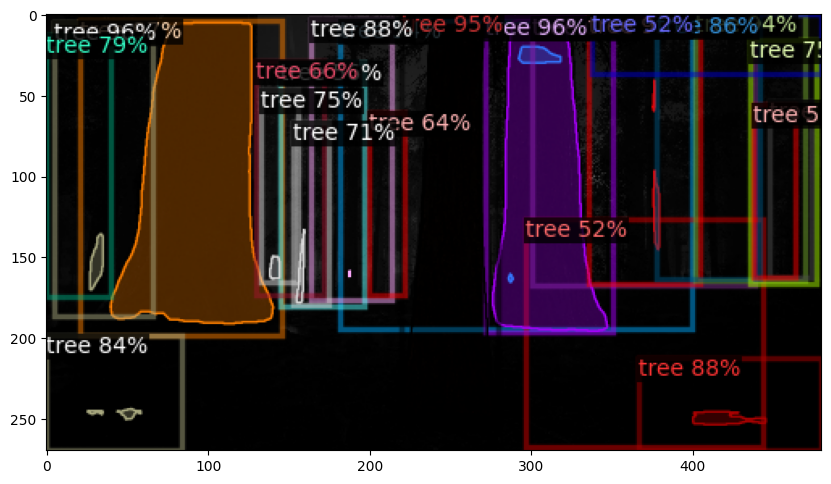

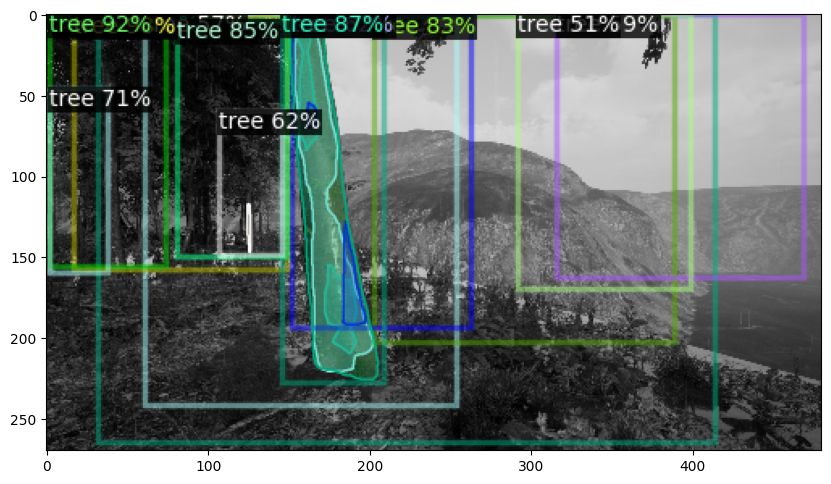

In [33]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 2):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

##### Check average precision and recall

In [34]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("spread_valid", output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "spread_valid")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[01/14 13:00:22 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/valid.json takes 9.85 seconds.
[01/14 13:00:23 d2.data.datasets.coco]: Loaded 3042 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/valid.json
[01/14 13:00:23 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    tree    | 126271       |
|            |              |
[01/14 13:00:23 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/14 13:00:23 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/14 13:00:23 d2.data.common]: Serializing 3042 elements to byte tensors and concatenating them all ...
[01/14 13:00:24 d2.data.common]: Serialized dataset takes 242.05 MiB
[01/14 13:00:24 d2.evaluation.evaluator]: Start inference on 3042 batches
[01/14 13:0

[01/14 13:03:50 d2.evaluation.evaluator]: Inference done 2714/3042. Dataloading: 0.0012 s/iter. Inference: 0.0618 s/iter. Eval: 0.0098 s/iter. Total: 0.0727 s/iter. ETA=0:00:23
[01/14 13:03:55 d2.evaluation.evaluator]: Inference done 2783/3042. Dataloading: 0.0012 s/iter. Inference: 0.0618 s/iter. Eval: 0.0098 s/iter. Total: 0.0727 s/iter. ETA=0:00:18
[01/14 13:04:00 d2.evaluation.evaluator]: Inference done 2852/3042. Dataloading: 0.0012 s/iter. Inference: 0.0618 s/iter. Eval: 0.0098 s/iter. Total: 0.0728 s/iter. ETA=0:00:13
[01/14 13:04:05 d2.evaluation.evaluator]: Inference done 2919/3042. Dataloading: 0.0012 s/iter. Inference: 0.0618 s/iter. Eval: 0.0098 s/iter. Total: 0.0728 s/iter. ETA=0:00:08
[01/14 13:04:10 d2.evaluation.evaluator]: Inference done 2988/3042. Dataloading: 0.0012 s/iter. Inference: 0.0618 s/iter. Eval: 0.0098 s/iter. Total: 0.0728 s/iter. ETA=0:00:03
[01/14 13:04:14 d2.evaluation.evaluator]: Total inference time: 0:03:41.704063 (0.073001 s / iter per device, on 1 

**Load a new image and segment it.**

In [35]:
os.makedirs('/tmp/trees', exist_ok=True)

In [36]:
!wget 'https://www.sciencefriday.com/wp-content/uploads/2021/12/Forest-trees.jpg' --output-document='/tmp/trees/Forest-trees.jpg'

--2025-01-14 14:05:57--  https://www.sciencefriday.com/wp-content/uploads/2021/12/Forest-trees.jpg
Resolving www.sciencefriday.com (www.sciencefriday.com)... 192.0.66.159, 2a04:fa87:fffd::c000:429f
Connecting to www.sciencefriday.com (www.sciencefriday.com)|192.0.66.159|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2359367 (2.2M) [image/jpeg]
Saving to: ‘/tmp/trees/Forest-trees.jpg’

/tmp/trees/Forest-t 100%[===================>]   2.25M  9.97MB/s    in 0.2s    

2025-01-14 14:05:57 (9.97 MB/s) - ‘/tmp/trees/Forest-trees.jpg’ saved [2359367/2359367]



In [37]:
def detectron2_predict(fn):
    new_im = cv2.imread(fn)
    outputs  = predictor(new_im)

    # We can use `Visualizer` to draw the predictions on the image.
    v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    cv2_imshow(out.get_image()[:, :, ::-1])

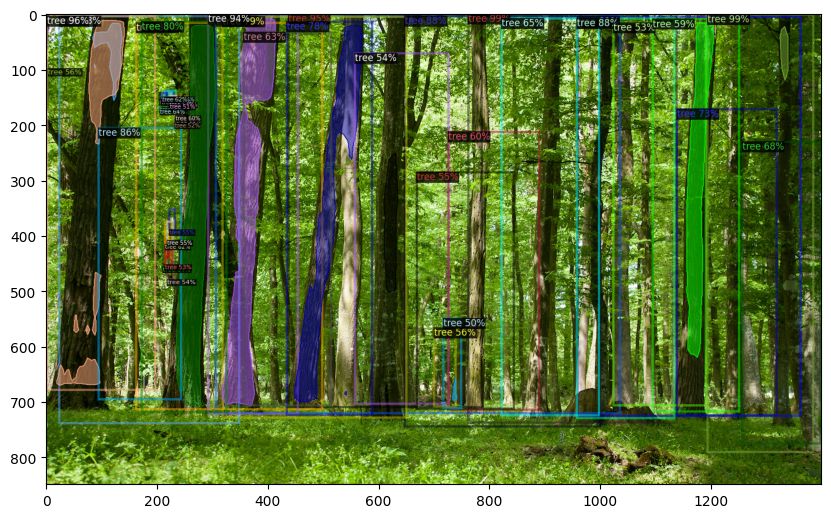

In [38]:
detectron2_predict(fn='/tmp/trees/Forest-trees.jpg')

--2025-01-14 14:05:58--  https://onetreeplanted.org/cdn/shop/files/black-forest-germany-1634665542362.jpg
Resolving onetreeplanted.org (onetreeplanted.org)... 23.227.38.32
Connecting to onetreeplanted.org (onetreeplanted.org)|23.227.38.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 668616 (653K) [image/jpeg]
Saving to: ‘/tmp/trees/black-forest-germany.jpg’

/tmp/trees/black-fo 100%[===================>] 652.95K  --.-KB/s    in 0.06s   

2025-01-14 14:05:58 (10.1 MB/s) - ‘/tmp/trees/black-forest-germany.jpg’ saved [668616/668616]



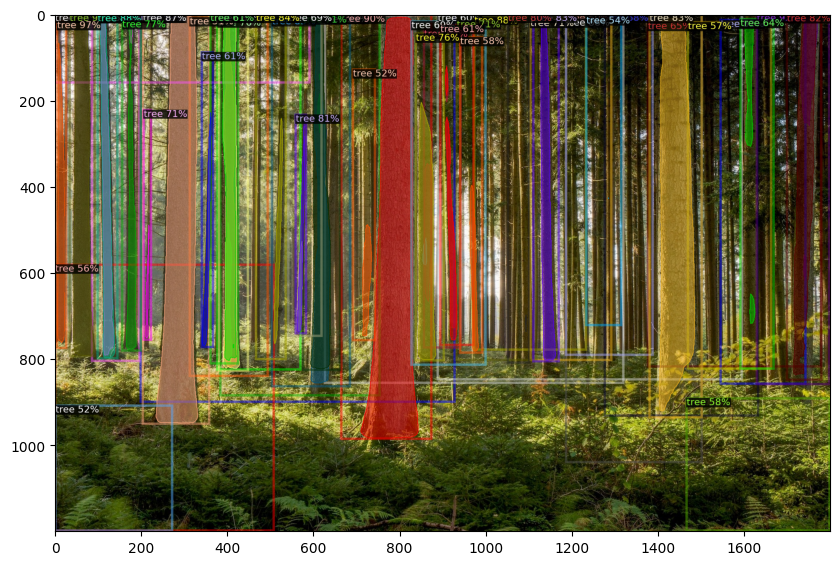

In [39]:
fn='/tmp/trees/black-forest-germany.jpg'
!wget 'https://onetreeplanted.org/cdn/shop/files/black-forest-germany-1634665542362.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-14 14:06:00--  https://onetreeplanted.org/cdn/shop/files/forest-in-the-rain-1634665541988.webp
Resolving onetreeplanted.org (onetreeplanted.org)... 23.227.38.32
Connecting to onetreeplanted.org (onetreeplanted.org)|23.227.38.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519362 (507K) [image/jpeg]
Saving to: ‘/tmp/trees/forest-in-the-rain.webp’

/tmp/trees/forest-i 100%[===================>] 507.19K  --.-KB/s    in 0.05s   

2025-01-14 14:06:00 (10.8 MB/s) - ‘/tmp/trees/forest-in-the-rain.webp’ saved [519362/519362]



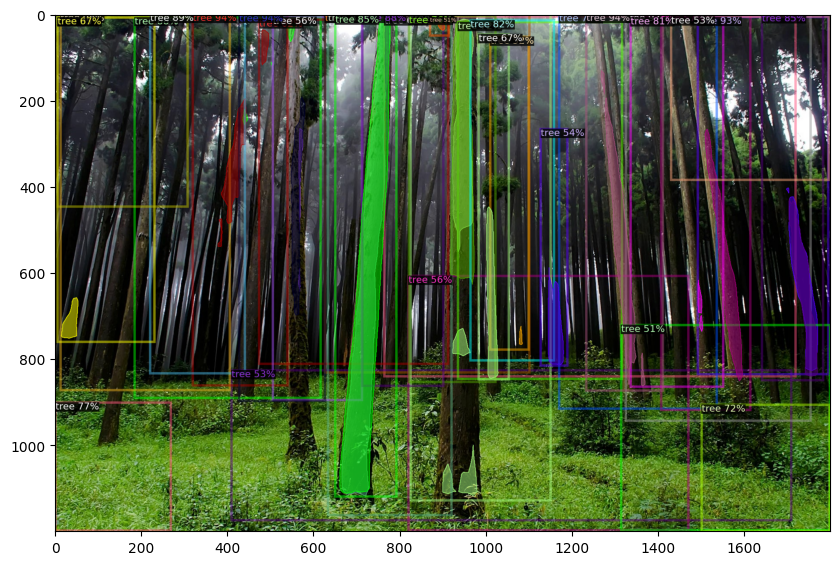

In [40]:
fn='/tmp/trees/forest-in-the-rain.webp'
!wget 'https://onetreeplanted.org/cdn/shop/files/forest-in-the-rain-1634665541988.webp' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-14 14:06:01--  https://www.nycgovparks.org/pagefiles/201/great-trees-banner__66fd87f0e849b.jpg
Resolving www.nycgovparks.org (www.nycgovparks.org)... 98.85.75.120, 34.200.3.35, 34.228.163.119
Connecting to www.nycgovparks.org (www.nycgovparks.org)|98.85.75.120|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2057733 (2.0M) [image/jpeg]
Saving to: ‘/tmp/trees/great-trees-in-nyc.jpg’

/tmp/trees/great-tr 100%[===================>]   1.96M  1.57MB/s    in 1.3s    

2025-01-14 14:06:03 (1.57 MB/s) - ‘/tmp/trees/great-trees-in-nyc.jpg’ saved [2057733/2057733]



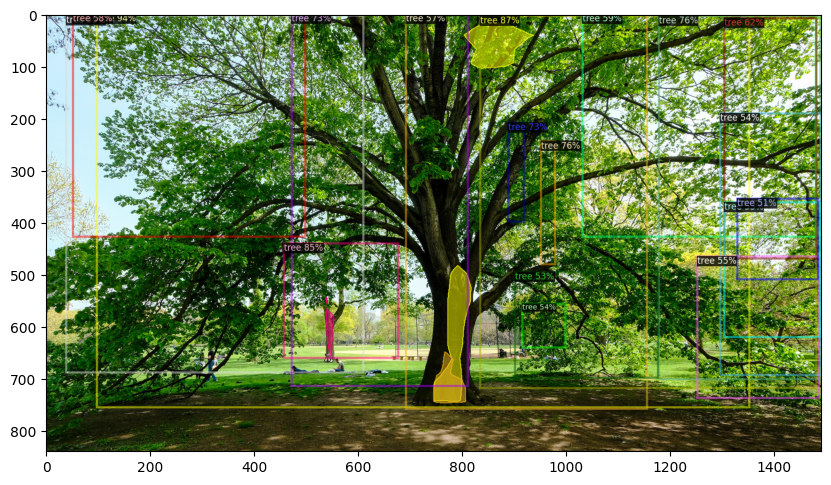

In [41]:
fn='/tmp/trees/great-trees-in-nyc.jpg'
!wget 'https://www.nycgovparks.org/pagefiles/201/great-trees-banner__66fd87f0e849b.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-14 14:06:04--  https://images.squarespace-cdn.com/content/v1/5cb3ca007a1fbd45aeff89ea/08d79b2d-21b5-41e9-9c52-1c14aaf2de34/nashville-tree-conservation-corps-how-trees-benefit-ecosystem-winter.jpg
Resolving images.squarespace-cdn.com (images.squarespace-cdn.com)... 146.75.60.238
Connecting to images.squarespace-cdn.com (images.squarespace-cdn.com)|146.75.60.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 274501 (268K) [image/jpeg]
Saving to: ‘/tmp/trees/tree-in-winter.jpg’

/tmp/trees/tree-in- 100%[===================>] 268.07K  --.-KB/s    in 0.03s   

2025-01-14 14:06:04 (8.98 MB/s) - ‘/tmp/trees/tree-in-winter.jpg’ saved [274501/274501]



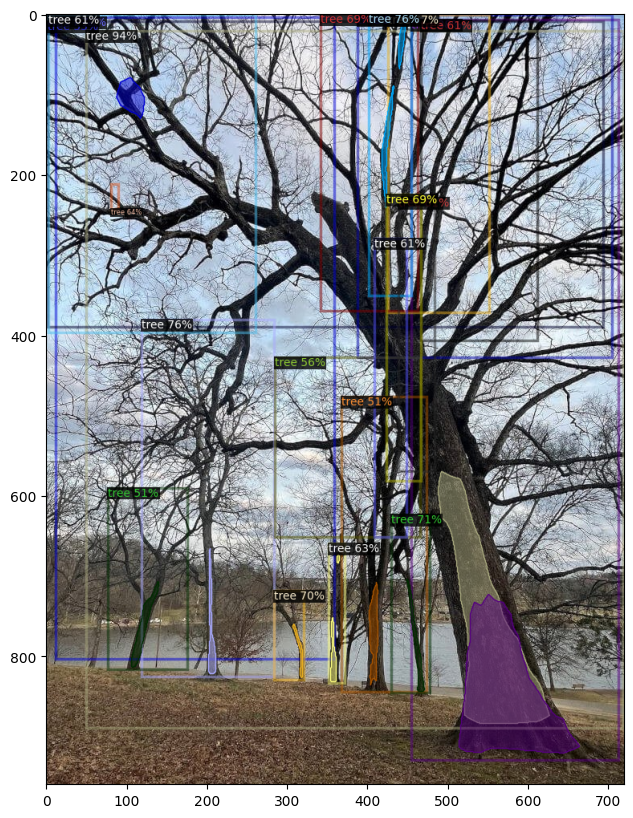

In [42]:
fn='/tmp/trees/tree-in-winter.jpg'
!wget 'https://images.squarespace-cdn.com/content/v1/5cb3ca007a1fbd45aeff89ea/08d79b2d-21b5-41e9-9c52-1c14aaf2de34/nashville-tree-conservation-corps-how-trees-benefit-ecosystem-winter.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-14 14:06:05--  https://www.arboroperations.com.au/wp-content/uploads/2021/08/american-elm.jpg
Resolving www.arboroperations.com.au (www.arboroperations.com.au)... 54.253.233.167
Connecting to www.arboroperations.com.au (www.arboroperations.com.au)|54.253.233.167|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1076645 (1.0M) [image/jpeg]
Saving to: ‘/tmp/trees/american-elm.jpg’

/tmp/trees/american 100%[===================>]   1.03M   501KB/s    in 2.1s    

2025-01-14 14:06:11 (501 KB/s) - ‘/tmp/trees/american-elm.jpg’ saved [1076645/1076645]



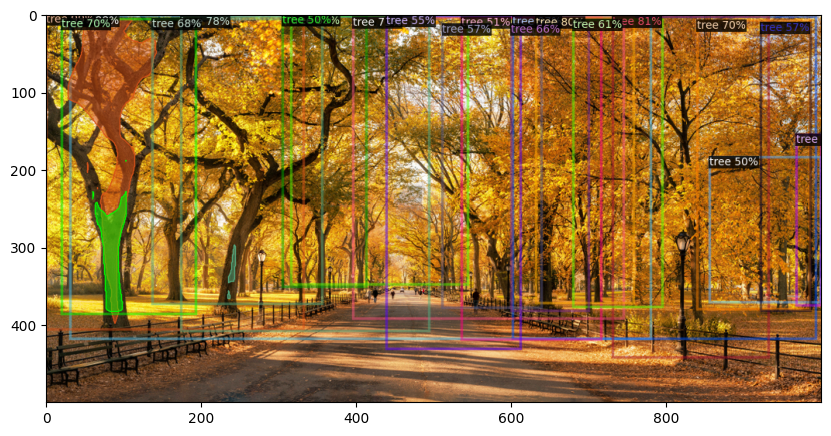

In [43]:
fn='/tmp/trees/american-elm.jpg'
!wget --user-agent='Mozilla 5.0' 'https://www.arboroperations.com.au/wp-content/uploads/2021/08/american-elm.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-14 14:06:12--  https://mothertreeproject.org/wp-content/uploads/2019/12/bill_web_still-image-test00086400_1-1.jpg
Resolving mothertreeproject.org (mothertreeproject.org)... 198.50.124.194
Connecting to mothertreeproject.org (mothertreeproject.org)|198.50.124.194|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 686185 (670K) [image/jpeg]
Saving to: ‘/tmp/trees/large-trees.jpg’

/tmp/trees/large-tr 100%[===================>] 670.10K   598KB/s    in 1.1s    

2025-01-14 14:06:14 (598 KB/s) - ‘/tmp/trees/large-trees.jpg’ saved [686185/686185]



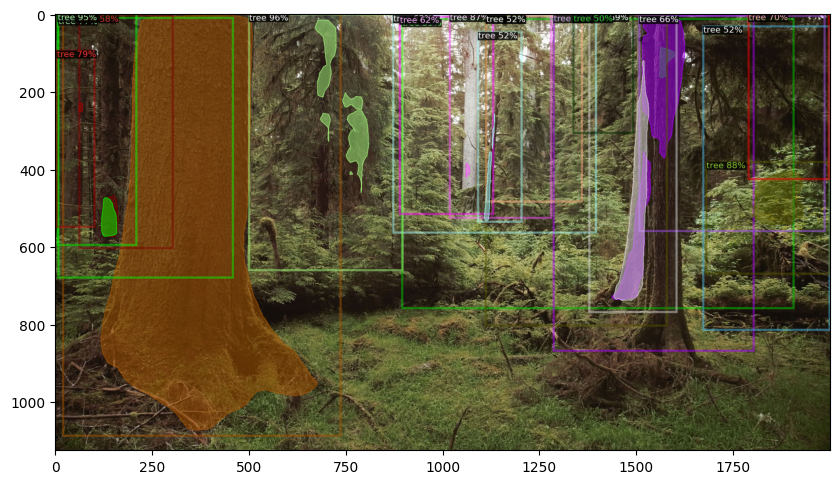

In [44]:
fn='/tmp/trees/large-trees.jpg'
!wget 'https://mothertreeproject.org/wp-content/uploads/2019/12/bill_web_still-image-test00086400_1-1.jpg' --output-document={fn}
detectron2_predict(fn=fn)

**Process multiple images in a directory and save the results in an output directory**

In [45]:
# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the segmented images will be saved
output_directory = "/tmp/trees/results"  # Replace this with the path to your desired output directory
os.makedirs(output_directory, exist_ok=True)

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)
    if os.path.isdir(image_path):
        continue
    print(f'Reading image: {image_path}')
    new_im = cv2.imread(image_path)

    # Perform prediction on the new image
    outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # We can use `Visualizer` to draw the predictions on the image.
    v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Create the output filename with _result extension
    result_filename = os.path.splitext(image_filename)[0] + "_result.png"
    output_path = os.path.join(output_directory, result_filename)

    # Save the segmented image
    cv2.imwrite(output_path, out.get_image()[:, :, ::-1])

print("Segmentation of all images completed.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Segmentation of all images completed.



**Segment images and save object level information into a csv file.**




In [46]:
import csv
from skimage.measure import regionprops, label


# Assuming you have already defined the 'predictor' object and loaded the model.
# Also, make sure 'metadata' is defined appropriately.

# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the CSV file will be saved
output_directory = "/tmp/trees/results"
output_csv_path  = f"{output_directory}/output_objects.csv"  # Replace this with the path to your desired output CSV file

# Open the CSV file for writing
with open(output_csv_path, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)

    # Write the header row in the CSV file
    csvwriter.writerow(["File Name", "Class Name", "Object Number", "Area", "Centroid", "BoundingBox"])  # Add more columns as needed for other properties

    # Loop over the images in the input folder
    for image_filename in os.listdir(input_images_directory):
        image_path = os.path.join(input_images_directory, image_filename)
        if os.path.isdir(image_path):
            continue
        print(f'Reading image: {image_path}')
        new_im = cv2.imread(image_path)

        # Perform prediction on the new image
        outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

        # Convert the predicted mask to a binary mask
        mask = outputs["instances"].pred_masks.to("cpu").numpy().astype(bool)

        # Get the predicted class labels
        class_labels = outputs["instances"].pred_classes.to("cpu").numpy()

        # Debugging: print class_labels and metadata.thing_classes
        #print("Class Labels:", class_labels)
        #print("Thing Classes:", train_metadata.thing_classes)

        # Use skimage.measure.regionprops to calculate object parameters
        labeled_mask = label(mask)
        props = regionprops(labeled_mask)

        # Write the object-level information to the CSV file
        for i, prop in enumerate(props):
            object_number = i + 1  # Object number starts from 1
            area = prop.area
            centroid = prop.centroid
            bounding_box = prop.bbox

            # Check if the corresponding class label exists
            if i < len(class_labels):
                class_label = class_labels[i]
                class_name = train_metadata.thing_classes[class_label]
            else:
                # If class label is not available (should not happen), use 'Unknown' as class name
                class_name = 'Unknown'

            # Write the object-level information to the CSV file
            csvwriter.writerow([image_filename, class_name, object_number, area, centroid, bounding_box])  # Add more columns as needed for other properties

print("Object-level information saved to CSV file.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Object-level information saved to CSV file.


**Generate plots to understand the objects**

/tmp/ipykernel_2087486/3638285612.py:23: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Class Name", y="Object Number", data=avg_objects_per_class, ci=None, order=class_names)


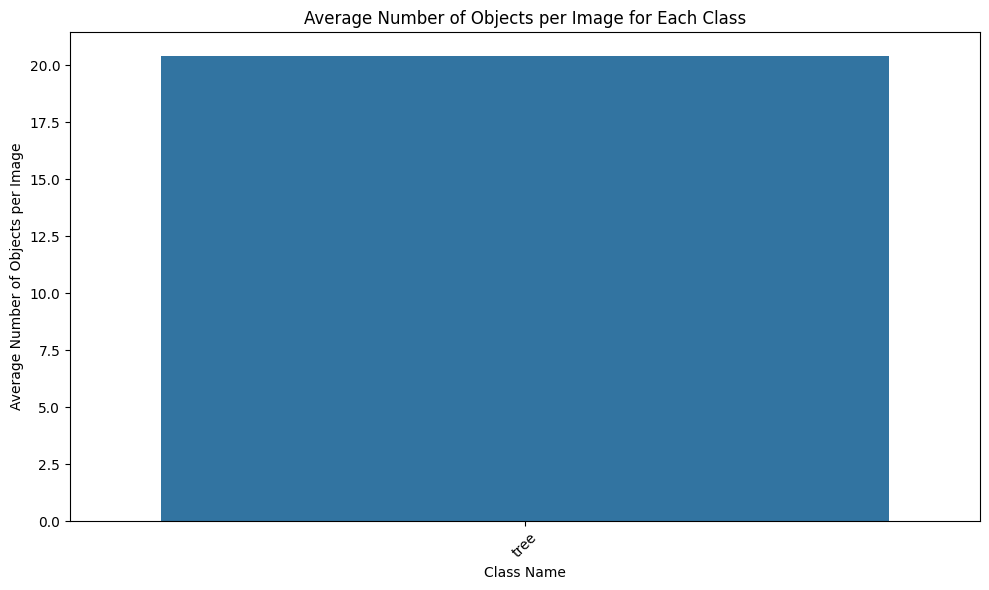

/tmp/ipykernel_2087486/3638285612.py:37: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Class Name", y="Area", data=avg_area_per_class, ci=None, order=class_names)


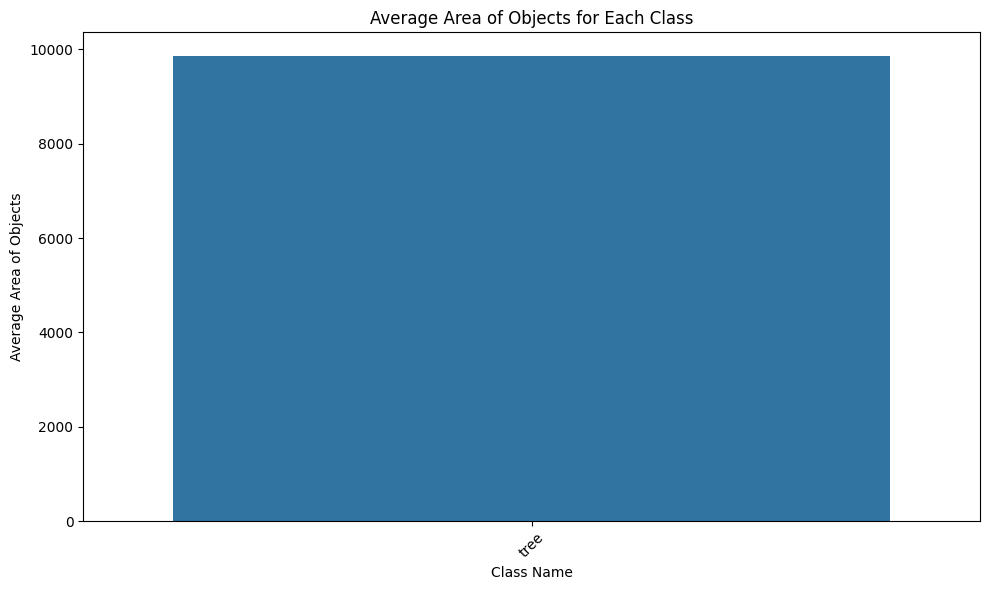

In [47]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Output directory where the CSV file will be saved
output_directory = "/tmp/trees/results"
csv_file_path    = f"{output_directory}/output_objects.csv"  # Replace this with the path to your desired output CSV file

# Load the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

# Get class names from train_metadata.thing_classes
class_names = train_metadata.thing_classes

# Group the data by both "File Name" and "Class Name" and calculate the average number of objects per image for each class
# first group the data by both "File Name" and "Class Name" and count the number of objects within each group.
#Then, group the data by "Class Name" only and calculate the mean of the counts, which gives us the average number of objects per image for each class.
avg_objects_per_class = df.groupby(["File Name", "Class Name"])["Object Number"].count().reset_index()
avg_objects_per_class = avg_objects_per_class.groupby("Class Name")["Object Number"].mean().reset_index()

# Plot: Average number of objects per image for each class
plt.figure(figsize=(10, 6))
sns.barplot(x="Class Name", y="Object Number", data=avg_objects_per_class, ci=None, order=class_names)
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Average Number of Objects per Image")
plt.title("Average Number of Objects per Image for Each Class")
plt.tight_layout()
plt.show()


# Group the data by class and calculate the average area of objects for each class
avg_area_per_class = df.groupby("Class Name")["Area"].mean().reset_index()

# Plot: Average area of objects for each class
plt.figure(figsize=(10, 6))
sns.barplot(x="Class Name", y="Area", data=avg_area_per_class, ci=None, order=class_names)
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Average Area of Objects")
plt.title("Average Area of Objects for Each Class")
plt.tight_layout()
plt.show()

**Saving binary (actually multinary) images for each class for further processing.** Here, for each input image we will save n images corresponding to the number of classes. In our example, we will save 4 images for each image corresponding to the 4 classes. Each of these images will contain objects numbered 1, 2, 3, etc. - basically instance segmentation like images. These images can be used for further downstream processing.

In [48]:
import os
import cv2
import numpy as np
import torch
from detectron2.utils.visualizer import Visualizer

# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the segmented images will be saved
output_directory = "/tmp/trees/results/instances"
os.makedirs(output_directory, exist_ok=True)

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)
    if os.path.isdir(image_path):
        continue
    print(f'Reading image: {image_path}')
    new_im = cv2.imread(image_path)

    # Perform prediction on the new image
    outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # Create a dictionary to store the mask for each class with unique integer labels
    class_masks = {class_name: torch.zeros_like(outputs["instances"].pred_masks[0], dtype=torch.uint8, device=torch.device("cuda:0"))
                   for class_name in train_metadata.thing_classes}

    # Assign a unique integer label to each object in the mask
    for i, pred_class in enumerate(outputs["instances"].pred_classes):
        class_name = train_metadata.thing_classes[pred_class]
        class_masks[class_name] = torch.where(outputs["instances"].pred_masks[i].to(device=torch.device("cuda:0")),
                                              i + 1,
                                              class_masks[class_name])

    # Save the masks for each class with unique integer labels
    for class_name, class_mask in class_masks.items():
        # Convert the tensor to a NumPy array and then to a regular (CPU) array
        class_mask_np = class_mask.cpu().numpy()

        # Create the output filename with _class_name_result.png extension
        class_filename = os.path.splitext(image_filename)[0] + f"_{class_name}_result.png"
        class_output_path = os.path.join(output_directory, class_filename)

        # Save the image with unique integer labels
        cv2.imwrite(class_output_path, class_mask_np.astype(np.uint8))

print("Segmentation of all images completed.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Segmentation of all images completed.
